In [ ]:
# Black and white images are not the same as the grayscale images. They are also
# represented similar to color images with 3 channels with [0,0,0] as comlete black
# [255,255,255] as complete white and [122,122,122] as middle grey.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import re
from tqdm import tqdm
import tensorflow
tensorflow.random.set_seed(23)
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from keras.constraints import Constraint
from keras import backend
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, Dropout, LeakyReLU, Concatenate,BatchNormalization,Add,ZeroPadding2D, ReLU
from tensorflow.keras import initializers, optimizers
from tensorflow.keras.models import Model
from numpy import ones, zeros
from tensorflow.keras.utils import plot_model

In [2]:
# to get the files in proper order
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)

files = os.listdir('../input/landscape-image-colorization/landscape Images/color')
files = sorted_alphanumeric(files)

Enter a number between 0 and 7129:  543


543
(150, 150, 3)


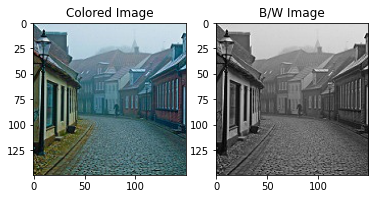

(150, 150, 3)


In [3]:
ran = int(input('Enter a number between 0 and {}: '.format(len(files))))
print(ran)
img = load_img('../input/landscape-image-colorization/landscape Images/color/'+str(ran)+'.jpg')
plt.subplot(121)
plt.imshow(img)
plt.title('Colored Image')
print(img_to_array(img).shape)

img = load_img('../input/landscape-image-colorization/landscape Images/gray/'+str(ran)+'.jpg')
plt.subplot(122)
plt.imshow(img)
plt.title('B/W Image')
plt.show()
print(img_to_array(img).shape)

In [4]:
bw_img = []
path = '../input/landscape-image-colorization/landscape Images/gray'
files = os.listdir(path)
files = sorted_alphanumeric(files)
print('No. of b/w images', str(len(files)))
for file in tqdm(files):
    img = load_img(path + '/'+file, target_size=(150,150))
    img = (img_to_array(img) - 127.5)/127.5
    bw_img.append(img)
    
color_img =[]
path = '../input/landscape-image-colorization/landscape Images/color'
files = os.listdir(path)
files = sorted_alphanumeric(files)
print('No. of colored images', str(len(files)))
for file in tqdm(files):
    img = load_img(path + '/'+file, target_size=(150,150))
    img = (img_to_array(img) - 127.5)/127.5
    color_img.append(img)
    
color_img = np.array(color_img).astype('float16')
bw_img = np.array(bw_img).astype('float16')

No. of b/w images 7129


100%|██████████| 7129/7129 [00:31<00:00, 227.76it/s]


No. of colored images 7129


100%|██████████| 7129/7129 [00:33<00:00, 211.70it/s]


2022-07-06 18:06:14.091737: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-06 18:06:14.178765: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-06 18:06:14.179501: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-06 18:06:14.180698: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 74, 74, 96)   4704        input_1[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 74, 74, 96)   0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 36, 36, 184)  282808      leaky_re_lu[0][0]                
______________________________________________________________________________________________

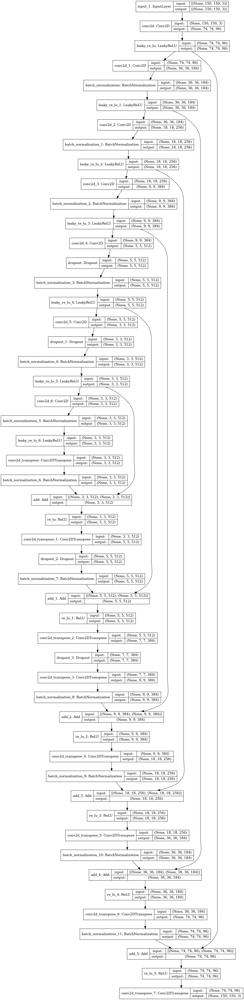

In [6]:
init_k = initializers.HeNormal(seed=23)
init_b = initializers.HeNormal(seed=37)
init = initializers.RandomNormal(stddev=0.02)

def generator():
    input_layer = Input((150,150,3))
    
    # Encoder Block
    d1 = Conv2D(96, (4,4), (2,2), kernel_initializer=init,
                bias_initializer=init)(input_layer)
    d1 = LeakyReLU()(d1)
    
    d2 = Conv2D(184, (4,4), (2,2), kernel_initializer=init,
                bias_initializer=init)(d1)
    d2 = BatchNormalization()(d2)
    d2 = LeakyReLU()(d2)
    
    d3 = Conv2D(256, (3,3), (2,2), padding='same', kernel_initializer=init,
                bias_initializer=init)(d2)
    d3 = BatchNormalization()(d3)
    d3 = LeakyReLU()(d3)
    
    d4 = Conv2D(384, (3,3), (2,2), padding='same', kernel_initializer=init,
                bias_initializer=init)(d3)
    d4 = BatchNormalization()(d4)
    d4 = LeakyReLU()(d4)
    
    d5 = Conv2D(512, (2,2), (2,2), padding='same' , kernel_initializer=init,
                bias_initializer=init)(d4)
    d5 = Dropout(0.1)(d5)
    d5 = BatchNormalization()(d5)
    d5 = LeakyReLU()(d5)
    
    d6 = Conv2D(512, (2,2), (2,2), padding='same', kernel_initializer=init,
                bias_initializer=init)(d5)
    d6 = Dropout(0.2)(d6)
    d6 = BatchNormalization()(d6)
    d6 = LeakyReLU()(d6)
    d7 = Conv2D(512, (2,2), (1,1), padding='same' , kernel_initializer=init,
                bias_initializer=init)(d6)
    d7 = BatchNormalization()(d7)
    d7 = LeakyReLU()(d7)
    
    #Decoder Block
    u1 = Conv2DTranspose(512, (1,1), (1,1), padding='same',
                         kernel_initializer=init_k, bias_initializer=init_k)(d7)
    u1 = BatchNormalization()(u1)
    u1 = Add()([u1, d6])
    u1 = ReLU()(u1)
    
    u2 = Conv2DTranspose(512, (3,3), (1,1), padding='valid',
                         kernel_initializer=init_k, bias_initializer=init_k)(u1)
    u2 = Dropout(0.1)(u2)
    u2 = BatchNormalization()(u2)
    u2 = Add()([u2,d5])
    u2 = ReLU()(u2)
    
    u3 = Conv2DTranspose(384, (3,3), (1,1), padding='valid', activation='relu',
                         kernel_initializer=init_k, bias_initializer=init_k)(u2)
    u3 = Dropout(0.2)(u3)
    u3 = Conv2DTranspose(384, (3,3), (1,1), padding='valid',
                         kernel_initializer=init_k, bias_initializer=init_k)(u3)
    u3 = BatchNormalization()(u3)
    u3 = Add()([u3, d4])
    u3 = ReLU()(u3)
    
    u4 = Conv2DTranspose(256, (3,3), (2,2), padding='same',
                         kernel_initializer=init_k, bias_initializer=init_k)(u3)
    u4 = BatchNormalization()(u4)
    u4 = Add()([u4, d3])
    u4 = ReLU()(u4)
    
    u5 = Conv2DTranspose(184, (3,3), (2,2), padding='same',
                         kernel_initializer=init_k, bias_initializer=init_k)(u4)
    u5 = BatchNormalization()(u5)
    u5 = Add()([u5, d2])
    u5 = ReLU()(u5)
    
    u6 = Conv2DTranspose(96, (3,3), (2,2), padding='valid', output_padding=(1,1))(u5)
    u6 = BatchNormalization()(u6)
    u6 = Add()([u6, d1])
    u6 = ReLU()(u6)
    u7 = Conv2DTranspose(3, (3,3), (2,2),padding='valid',activation='tanh',
                         output_padding=(1,1))(u6)

    model = Model(inputs = input_layer, outputs=u7)
    return model

generator=generator()
print(generator.summary())
plot_model(generator, to_file='generator.png', show_shapes=True)

/opt/conda/lib/python3.7/site-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
concatenate (Concatenate)       (None, 150, 150, 6)  0           input_2[0][0]                    
                                                                 input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_7 (Conv2D)               (None, 74, 74, 126)  12222       concatenate[0][0]          

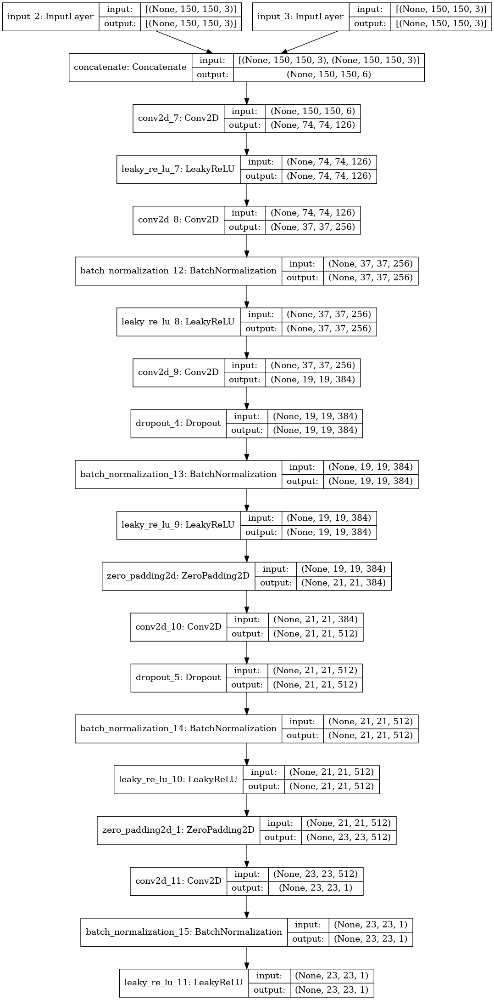

In [7]:
# clip model weights to a given hypercube
class ClipConstraint(Constraint):
    # set clip value when initialized
    def __init__(self, clip_value):
        self.clip_value = clip_value

    # clip model weights to hypercube
    def __call__(self, weights):
        return backend.clip(weights, -self.clip_value, self.clip_value)

    # get the config
    def get_config(self):
        return {'clip_value': self.clip_value}
    

    
def discriminator():
    const = ClipConstraint(0.01)
    input_layer1 = Input((150,150,3))
    input_layer2 = Input((150,150,3))
    input_layer = Concatenate()([input_layer1, input_layer2])
    
    d1 = Conv2D(126, (4,4), (2,2),
                kernel_initializer=init,
                bias_initializer=init, kernel_constraint=const)(input_layer)
    d1 = LeakyReLU()(d1)
    
    d2 = Conv2D(256, (4,4), (2,2), padding='same', kernel_initializer=init,
                bias_initializer=init, kernel_constraint=const)(d1)
    d2 = BatchNormalization()(d2)
    d2 = LeakyReLU()(d2)
    
    d3 = Conv2D(384, (4,4), (2,2), padding='same', kernel_initializer=init,
                bias_initializer=init, kernel_constraint=const)(d2)
    d3 = Dropout(0.1)(d3)
    d3 = BatchNormalization()(d3)
    d3 = LeakyReLU()(d3)
    p1 = ZeroPadding2D()(d3)
    
    d4 = Conv2D(512, (4,4), (1,1), padding='same', kernel_initializer=init,
                bias_initializer=init, kernel_constraint=const)(p1)
    d4 = Dropout(0.15)(d4)
    d4 = BatchNormalization()(d4)
    d4 = LeakyReLU()(d4)
    p2 = ZeroPadding2D()(d4)
    
    d5 = Conv2D(1, (4,4), (1,1), padding='same', kernel_initializer=init,
                bias_initializer=init, kernel_constraint=const)(p2)
    d5 = BatchNormalization()(d5)
    d5 = LeakyReLU()(d5)
    
    model = Model([input_layer1, input_layer2], outputs=d5)
    opt = optimizers.Adam(lr=0.00002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=0.5)
    return model

discriminator = discriminator()
print(discriminator.summary())
plot_model(discriminator,to_file='discriminator.png', show_shapes=True)

In [8]:
# calculate the effective receptive field size
def receptive_field(output_size, kernel_size, stride_size):
    return  kernel_size + stride_size*(output_size - 1) 
# k(l-1) = k + s(k(l)-1) by backtracing

rf = receptive_field(1, 4, 1)
print(rf)

rf = receptive_field(rf, 4, 1)
print(rf)

rf = receptive_field(rf, 4, 2)
print(rf)

rf = receptive_field(rf, 4, 2)
print(rf)

rf = receptive_field(rf, 4, 2)
print(rf)

4
7
16
34
70


Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
model (Functional)              (None, 150, 150, 3)  11689747    input_4[0][0]                    
__________________________________________________________________________________________________
model_1 (Functional)            (None, 23, 23, 1)    5260867     input_4[0][0]                    
                                                                 model[0][0]                      
Total params: 16,950,614
Trainable params: 11,681,139
Non-trainable params: 5,269,475
__________________________________________________________________________________________________
None


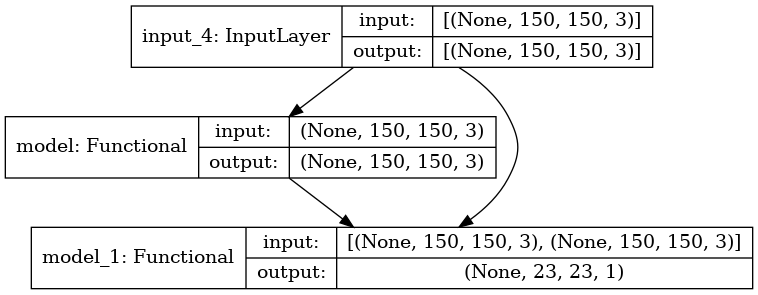

In [9]:
def generate_real_samples(trainA,trainB, n_samples, n_patch):
    idx = np.random.randint(0, len(trainA), n_samples)
    X1, X2 = trainA[idx], trainB[idx]
    # generate 'real' class labels (1)
    y = ones((n_samples, n_patch, n_patch, 1))
    return X1, X2, y, idx

def generate_fake_samples(g_model, samples, n_patch):
    X = g_model.predict(samples)
    # create 'fake' class labels (0)
    y = zeros((len(X), n_patch, n_patch, 1))
    return X, y



''' define the combined generator and discriminator model, for updating the generator
    by keeping the discriminator to trainable == False '''
def update_gen(g_model, d_model):
    d_model.trainable=False
    input_img = Input((150,150,3))
    gen_out = g_model(input_img)
    disc_out = d_model([input_img, gen_out])
    model = Model(input_img, [disc_out, gen_out])
    opt = optimizers.Adam(learning_rate=0.00002, beta_1=0.5)
    model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt,
                  loss_weights=[1,150])
    return model

gen_update_model = update_gen(generator,discriminator)
print(gen_update_model.summary())
plot_model(gen_update_model,to_file='generator_updation.png', show_shapes=True)

In [10]:
def plott(data_c, data_g):
    n = np.random.randint(1000)
    pred = gen_update_model.layers[1].predict(data_g[n].reshape((1,150,150,3)))
    pred = (pred*127.5)+127.5
    pred = pred/255.
    plt.figure(figsize=(20,10))

    plt.subplot(131)
    g= (data_g[n]*127.5)+127.5
    g= g/255.
    plt.imshow(g.astype(np.float32))
    plt.title('Black/White Image')

    plt.subplot(132)
    c = (data_c[n]*127.5)+127.5
    c = c/255.
    plt.imshow(c.astype(np.float32))
    plt.title('Color Image')

    plt.subplot(133)
    plt.imshow(pred[0])
    plt.title('Predicted Image')
    plt.show()

In [11]:
def pix2pix_train(d_model, g_model, gen_update_model, trainA,trainB, n_epochs, n_batch):
    batches_per_epoch = int(len(trainA) / n_batch)
    n_patch = d_model.output_shape[1]
    disc_loss1 = []
    disc_loss2 = []
    gen_loss = []
    for i in range(n_epochs):
        A,B = trainA, trainB
        for j in tqdm(range(batches_per_epoch)):
            # select a batch of real samples
            real_g, real_c, y_real_label, idx=generate_real_samples(A, B,
                                                                 n_batch,n_patch)
            # deleting the already sampled records
            A = np.delete(A, idx, axis=0)
            B = np.delete(B, idx, axis=0)
            # generate a batch of fake samples
            fake_c, y_fake_label = generate_fake_samples(g_model, real_g, n_patch)
            for _ in range(5):
                # update discriminator for real samples, 5 times to that of generator
                d_loss_real = d_model.train_on_batch([real_g, real_c], y_real_label)
                # update discriminator for generated samples, 5 times to that of generator
            for _ in range(2):
                d_loss_generated = d_model.train_on_batch([real_g,fake_c], y_fake_label)
            # update the generator
            g_loss, _, _ =gen_update_model.train_on_batch(real_g, [y_real_label,real_c])
        disc_loss1.append(d_loss_real)
        disc_loss2.append(d_loss_generated)
        gen_loss.append(g_loss)
        print('>%d, d_loss_real[%.3f] d_loss_generated[%.3f] gen_loss[%.3f]' % (i+1,
                                            d_loss_real, d_loss_generated,g_loss))
        
        plott(c_test, bw_test) # Plotting the results for the test set after every epochs
        gen_update_model.layers[1].save('gen'+ str(i+1)+ '.h5') 
        # Saving only the generator part of the gen_update_model
    return disc_loss1, disc_loss2, gen_loss

In [12]:
from sklearn.model_selection import train_test_split
bw_train, bw_test, c_train, c_test = train_test_split(bw_img, color_img,
                                                     test_size = 0.2, random_state=23)
bw_train.shape, bw_test.shape, c_train.shape, c_test.shape

((5703, 150, 150, 3),
 (1426, 150, 150, 3),
 (5703, 150, 150, 3),
 (1426, 150, 150, 3))

In [13]:
# deleting the unnecessary arrays to free up some RAM
import gc
del bw_img
gc.collect()
del color_img
gc.collect()

0

  0%|          | 0/1140 [00:00<?, ?it/s]2022-07-06 18:07:18.251952: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-07-06 18:07:19.572580: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005
100%|██████████| 1140/1140 [09:48<00:00,  1.94it/s]


>1, d_loss_real[1.946] d_loss_generated[0.428] gen_loss[39.314]


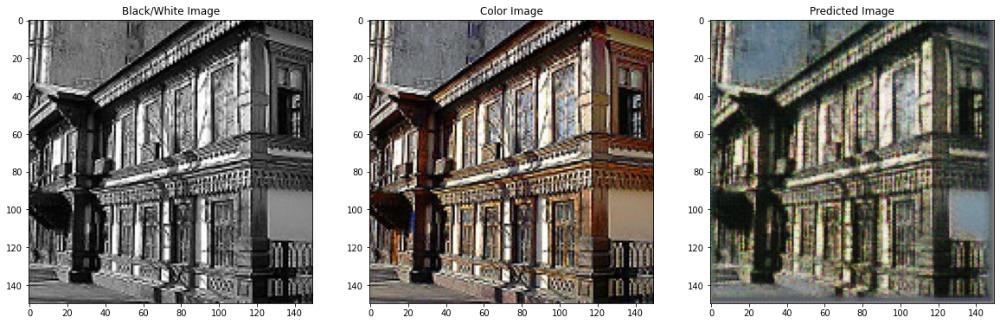

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)
100%|██████████| 1140/1140 [09:34<00:00,  1.98it/s]


>2, d_loss_real[1.389] d_loss_generated[0.200] gen_loss[43.208]


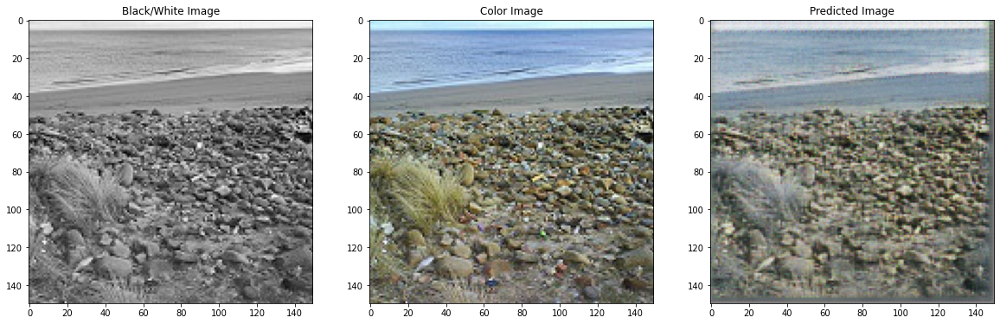

100%|██████████| 1140/1140 [09:41<00:00,  1.96it/s]


>3, d_loss_real[1.263] d_loss_generated[0.249] gen_loss[27.104]


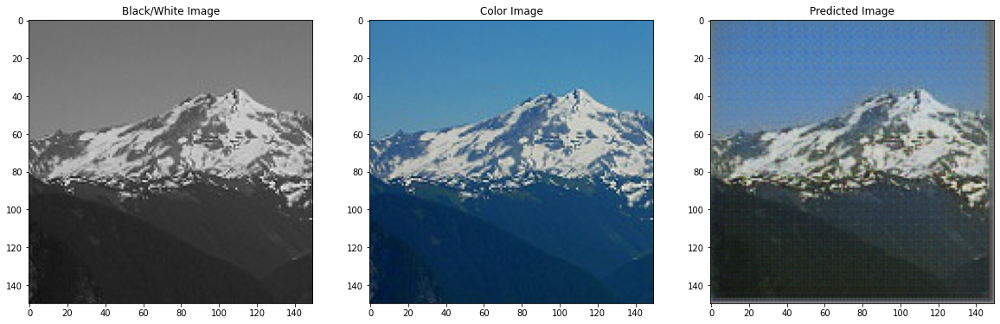

100%|██████████| 1140/1140 [09:42<00:00,  1.96it/s]


>4, d_loss_real[1.205] d_loss_generated[0.325] gen_loss[19.612]


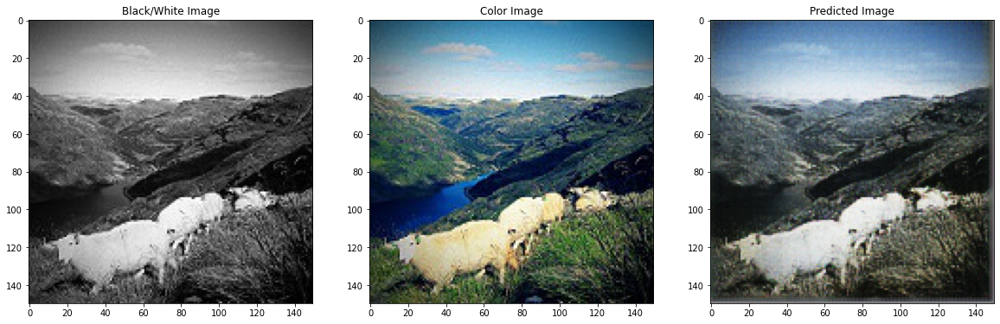

100%|██████████| 1140/1140 [09:37<00:00,  1.97it/s]


>5, d_loss_real[1.578] d_loss_generated[0.617] gen_loss[21.186]


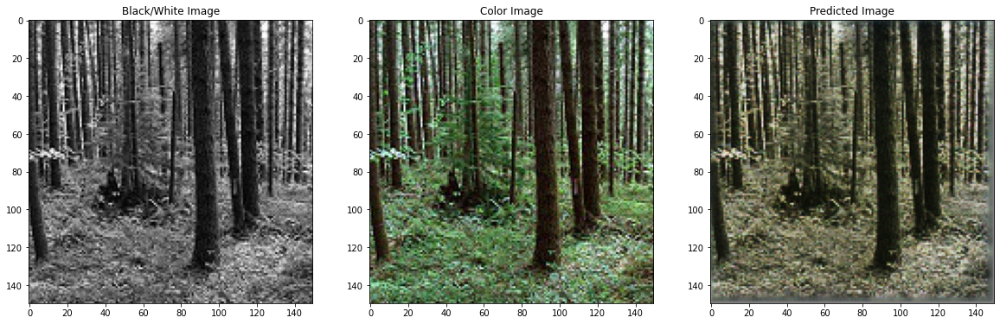

100%|██████████| 1140/1140 [09:37<00:00,  1.97it/s]


>6, d_loss_real[1.082] d_loss_generated[0.403] gen_loss[23.248]


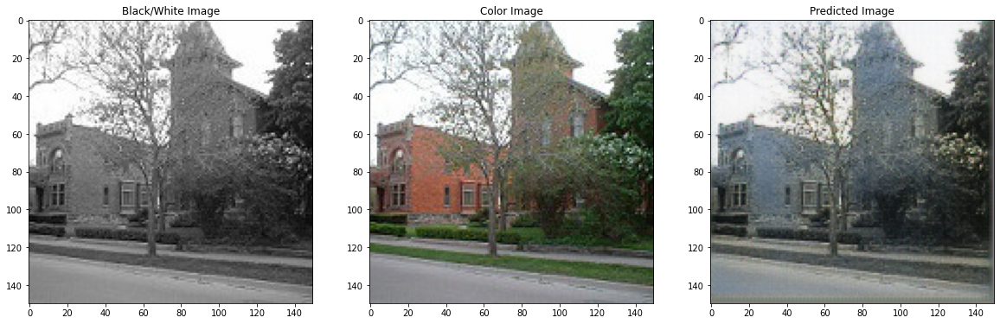

100%|██████████| 1140/1140 [09:38<00:00,  1.97it/s]


>7, d_loss_real[0.885] d_loss_generated[0.365] gen_loss[18.167]


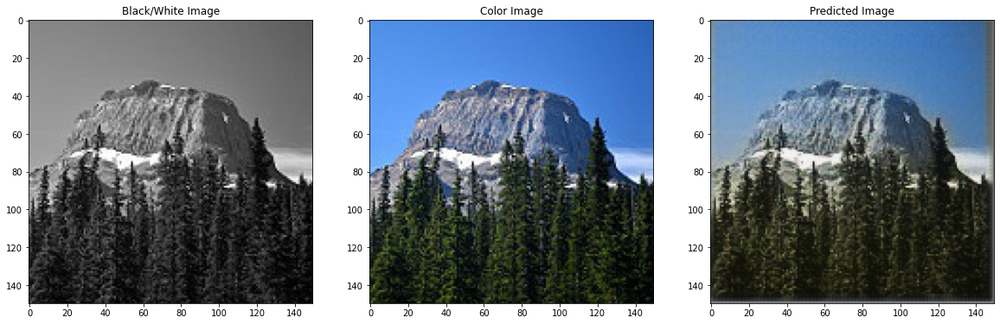

100%|██████████| 1140/1140 [09:39<00:00,  1.97it/s]


>8, d_loss_real[0.813] d_loss_generated[0.387] gen_loss[21.356]


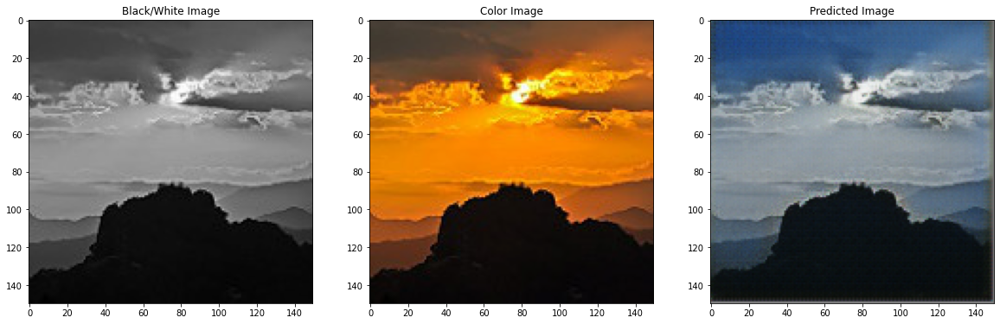

100%|██████████| 1140/1140 [09:38<00:00,  1.97it/s]


>9, d_loss_real[0.676] d_loss_generated[0.378] gen_loss[20.708]


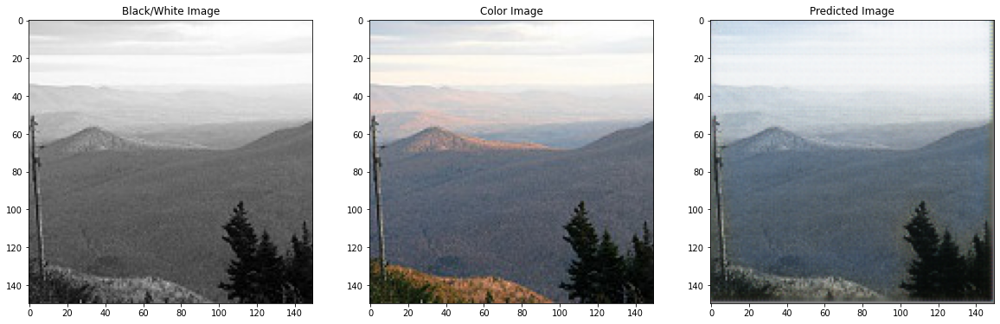

100%|██████████| 1140/1140 [09:38<00:00,  1.97it/s]


>10, d_loss_real[0.778] d_loss_generated[0.411] gen_loss[18.955]


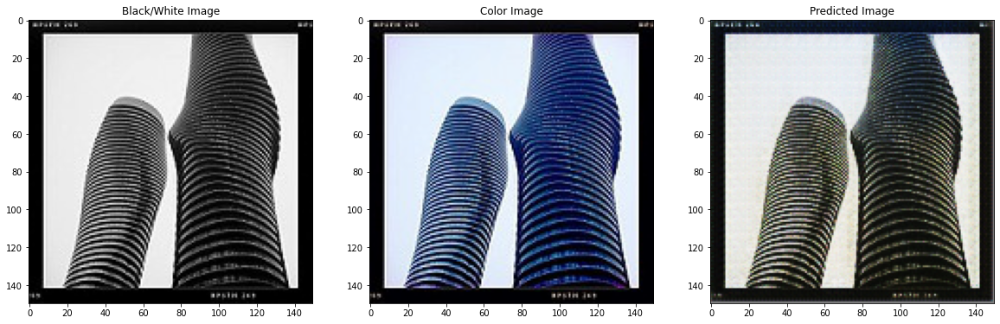

100%|██████████| 1140/1140 [09:37<00:00,  1.97it/s]


>11, d_loss_real[0.888] d_loss_generated[0.426] gen_loss[28.940]


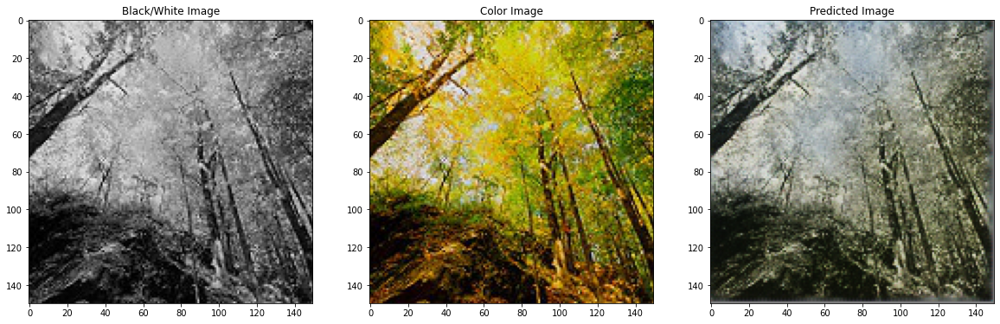

100%|██████████| 1140/1140 [09:38<00:00,  1.97it/s]


>12, d_loss_real[0.554] d_loss_generated[0.391] gen_loss[26.870]


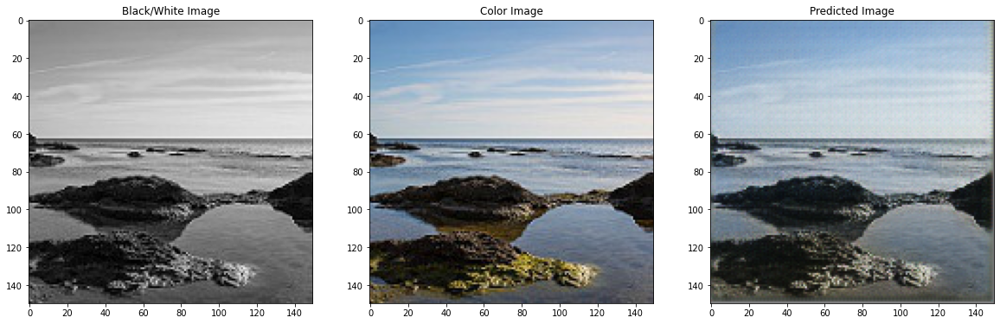

100%|██████████| 1140/1140 [09:37<00:00,  1.98it/s]


>13, d_loss_real[0.752] d_loss_generated[0.641] gen_loss[18.494]


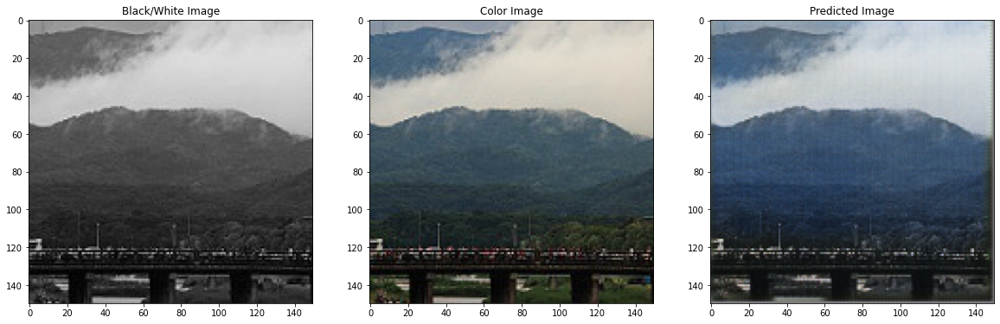

100%|██████████| 1140/1140 [09:38<00:00,  1.97it/s]


>14, d_loss_real[0.698] d_loss_generated[0.450] gen_loss[17.153]


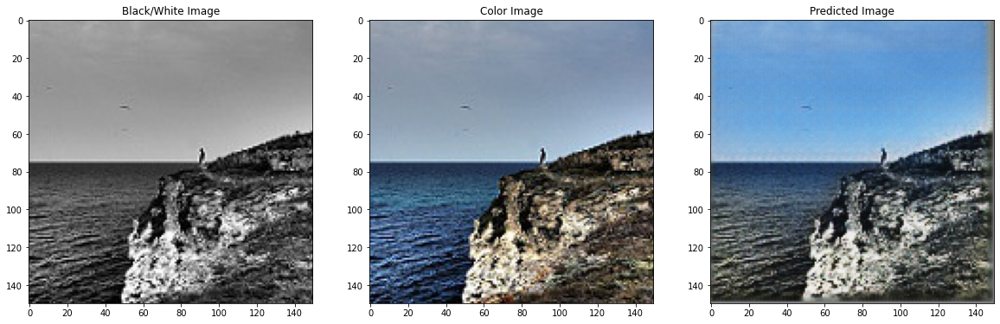

100%|██████████| 1140/1140 [09:47<00:00,  1.94it/s]


>15, d_loss_real[0.607] d_loss_generated[0.595] gen_loss[16.460]


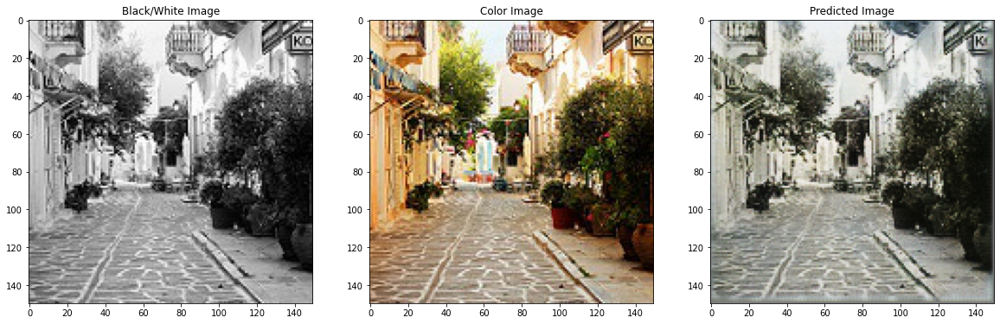

100%|██████████| 1140/1140 [09:49<00:00,  1.93it/s]


>16, d_loss_real[0.748] d_loss_generated[0.561] gen_loss[14.615]


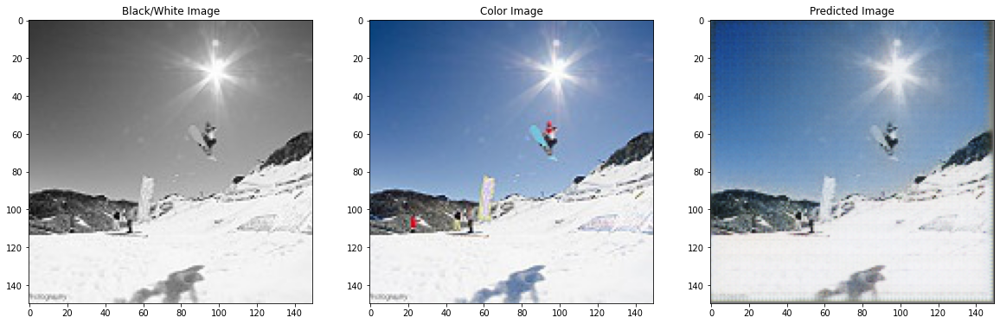

100%|██████████| 1140/1140 [09:49<00:00,  1.94it/s]


>17, d_loss_real[1.063] d_loss_generated[1.082] gen_loss[24.937]


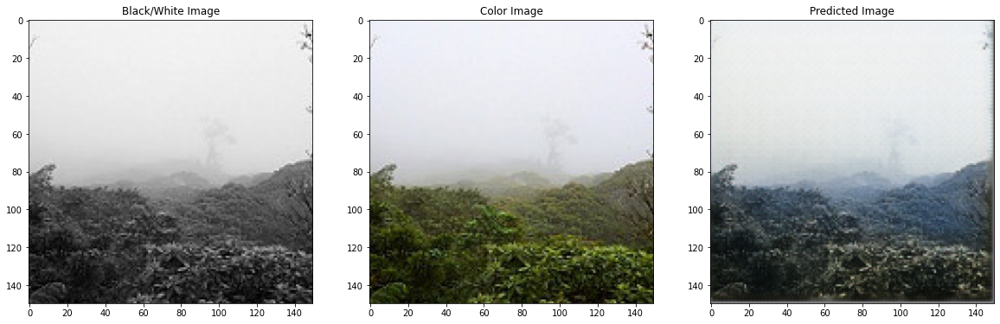

100%|██████████| 1140/1140 [09:50<00:00,  1.93it/s]


>18, d_loss_real[0.757] d_loss_generated[0.580] gen_loss[22.540]


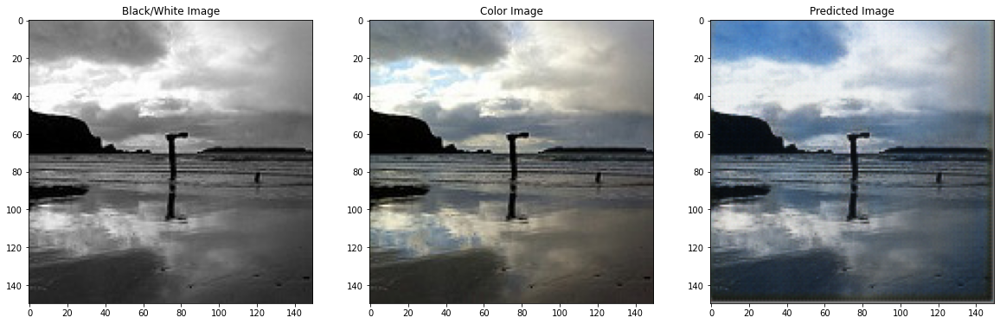

100%|██████████| 1140/1140 [09:51<00:00,  1.93it/s]


>19, d_loss_real[0.466] d_loss_generated[0.566] gen_loss[26.083]


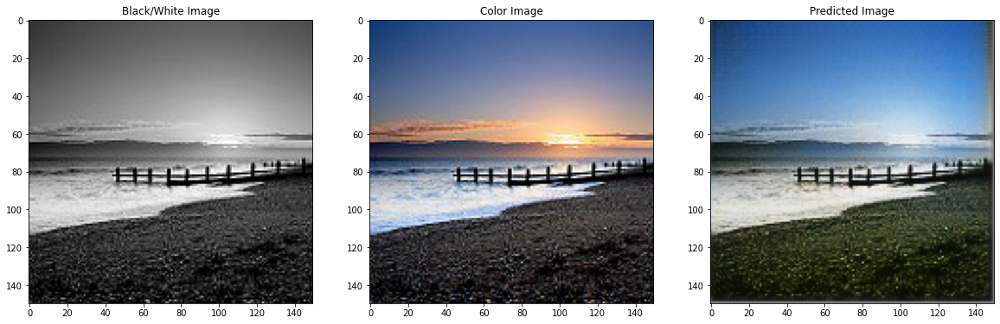

100%|██████████| 1140/1140 [09:53<00:00,  1.92it/s]


>20, d_loss_real[0.637] d_loss_generated[0.774] gen_loss[16.002]


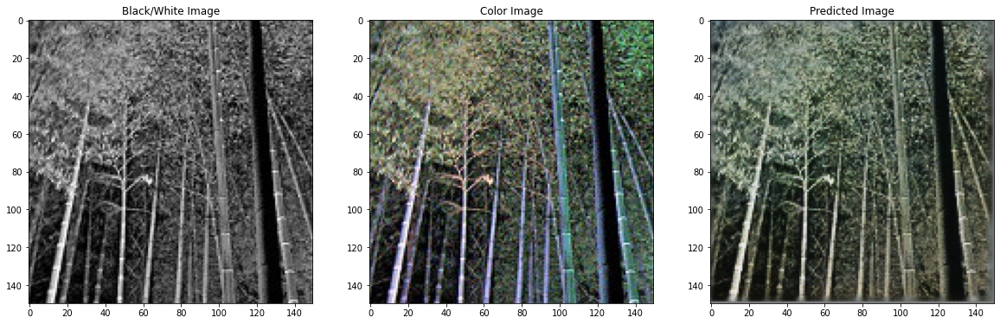

In [14]:
history = pix2pix_train(discriminator, generator, gen_update_model,trainA= bw_train,
                        trainB=c_train,n_epochs=20, n_batch=5)

# The predictions below are for the test sets
# Here d_real_loss should decrease while d_generated_loss should increase

Text(0.5, 1.0, 'Generator Loss')

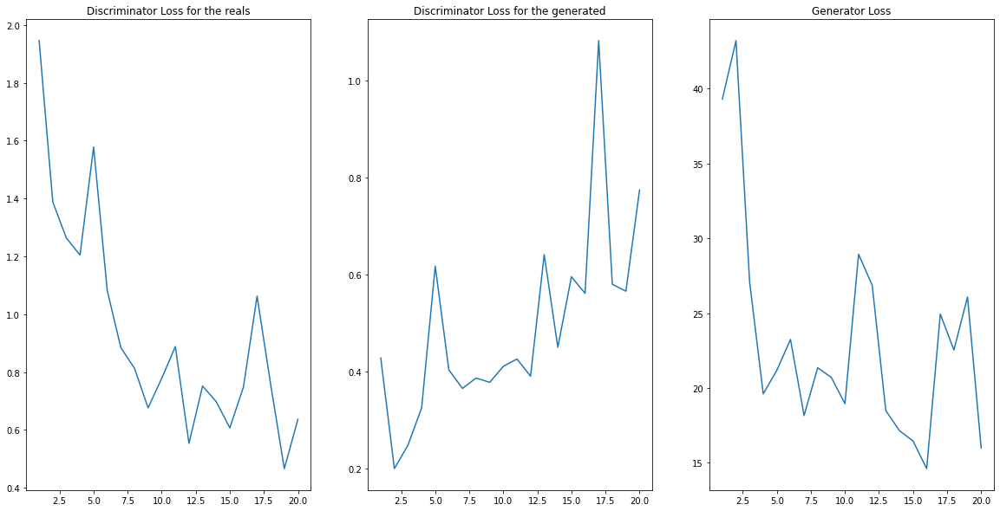

In [15]:
plt.figure(figsize=(20,10))
plt.subplot(131)
plt.plot(np.arange(1,21), history[0])
plt.title('Discriminator Loss for the reals')

plt.subplot(132)
plt.plot(np.arange(1,21), history[1])
plt.title('Discriminator Loss for the generated')

plt.subplot(133)
plt.plot(np.arange(1,21), history[2])
plt.title('Generator Loss')

In [ ]:
''' From the above, it looks like discriminator loss for real samples is decreasing which means that the
    discriminator is improving in recognizing real samples as real.
    
    Also, the discriminator loss for generated samples is increasing which means that the discriminator
    is unable to recognize generated samples as fake (discriminator is getting fooled which is desired)

In [16]:
from keras.applications.inception_v3 import InceptionV3
from numpy import cov
from scipy.linalg import sqrtm
from numpy import trace
from numpy import iscomplexobj


''' Calculating the Frechet Inception Distance (FID) '''

def calculate_fid(model, images1, images2):
    act1 = model.predict(images1)
    act2 = model.predict(images2)
    # calculate mean and covariance statistics
    mu1, cov1 = act1.mean(axis=0), cov(act1, rowvar=False)
    mu2, cov2 = act2.mean(axis=0), cov(act2, rowvar=False)

    diff = np.sum((mu1 - mu2)**2.0)
    cov_mean = sqrtm(cov1.dot(cov2))
    # check and correct imaginary numbers from sqrt
    if iscomplexobj(cov_mean):
        cov_mean = cov_mean.real
    fid = diff + trace(cov1 + cov2 - 2.0 * cov_mean)
    return fid

inception_base = InceptionV3(include_top=False, pooling='avg', input_shape=(150,150,3))
gen_model = tensorflow.keras.models.load_model('./gen20.h5')
pred = gen_model.predict(bw_test)
images1=((pred*127.5) + 127.5)/255
images2 = ((c_test*127.5) + 127.5)/255
fid = calculate_fid(inception_base, images1, images2)
print('FID on the test set is: ',fid)

87924736/87910968 [==============================] - 3s 0us/step
FID on the test set is:  192.13049869294804
